In [1]:
import numpy as np
from math import pow
import matplotlib.pyplot as plt
plt.style.use('bmh')
# Set background color to antique white
plt.rcParams['axes.facecolor'] = "#F5F4F2"
import os
from utils import *
from utils import grid_to_real_projection
from simulation import *
from tqdm import tqdm
from pprint import pprint

from models import DistanceCellModel, VectorCellModel, NestedModel
from simulation import run_load_simulation
OUTPUT_DIR = 'simulation_outputs'
# ================= MODEL & SIMULATION PARAMETERS =================
#N_SIM_ROUND = 5
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
model_names = ['nm', 'dcm', 'vcm']

In [5]:
N_SIM_ROUND = 12
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
HEX_PROJ=True
model_names = ['nm', 'dcm', 'vcm']

no_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None}}
example_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None},
                     'shear1': {'distortion': 'shear', 'a': 0, 'b': 0.3},
                     'stretch1': {'distortion': 'stretch', 'a': 1, 'b': 0.67}}

# Global distortion parameters
shear_drift_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 3, 5], 'b_drift': [0.1]}, 
                                     'shear+drift-global', incl_undistorted=False)

shear_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                     'shear-global', incl_undistorted=False)
stretch_global_params = get_param_dict({'a': [1], 'b': [1, 0.7, 0.5, 0.3, 0.1]}, 
                                       'stretch-global', incl_undistorted=False)

# Local distortion parameters
shear_local_params = get_param_dict({'a': [0], 'b': [0, 0.05, 0.1, 0.3, 0.5]}, 
                                     'shear-local', incl_undistorted=False)
stretch_local_params = get_param_dict({'a': [1], 'b': [1, 0.99, 0.95, 0.9, 0.7]}, 
                                       'stretch-local', incl_undistorted=False)

# Modular distortion parameters
shear_modular_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                'shear-modular', incl_undistorted=False)
stretch_modular_params = get_param_dict({'a': [1], 'b': [1, 0.7, 0.5, 0.3, 0.1]},  # WARNING: Here b_final is 1 - b, so at b=0.5 we'd have b_M's = [0.99, 0.98, 0.97, 0.96, 0.93, 0.9 , 0.85, 0.78, 0.67, 0.5 ]
                                'stretch-modular', incl_undistorted=False)


{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=12500 (DCM)
	xdc_positions=[[-250.   -249.96 -249.92],...,[249.88 249.92 249.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [01:14<00:00,  1.35it/s]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-12500_Nfvc-None.pkl



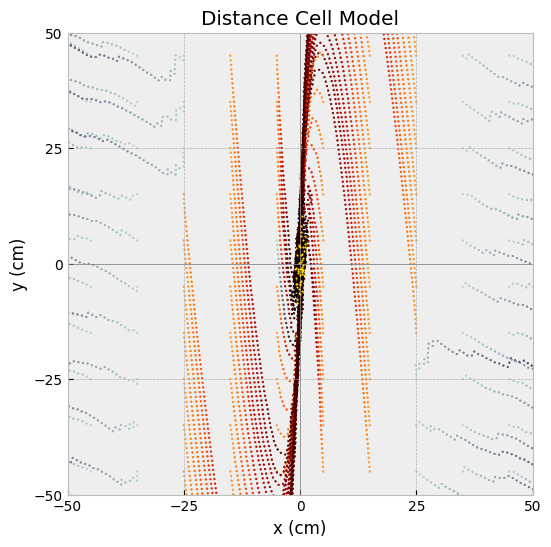

Successful trials: 53/100 (53.0%)
{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=15000 (DCM)
	xdc_positions=[[-300.   -299.96 -299.92],...,[299.88 299.92 299.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [01:29<00:00,  1.12it/s]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-15000_Nfvc-None.pkl



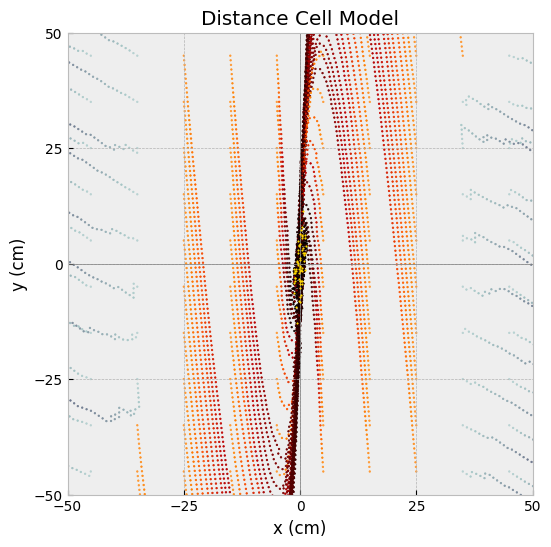

Successful trials: 63/100 (63.0%)
{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=17500 (DCM)
	xdc_positions=[[-350.   -349.96 -349.92],...,[349.88 349.92 349.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [01:54<00:00,  1.15s/it]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-17500_Nfvc-None.pkl



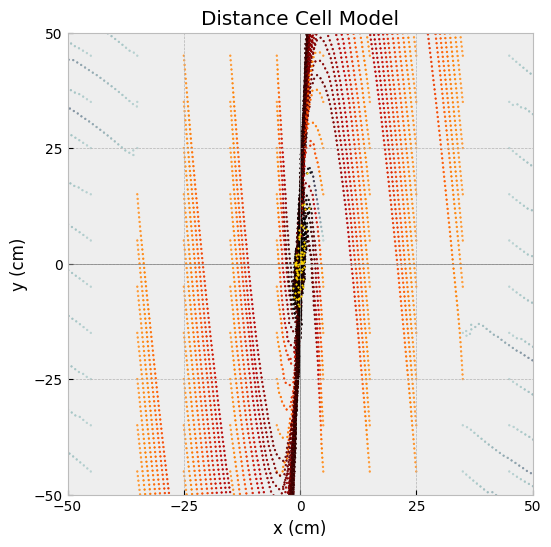

Successful trials: 73/100 (73.0%)
{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=20000 (DCM)
	xdc_positions=[[-400.   -399.96 -399.92],...,[399.88 399.92 399.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [02:12<00:00,  1.32s/it]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-20000_Nfvc-None.pkl



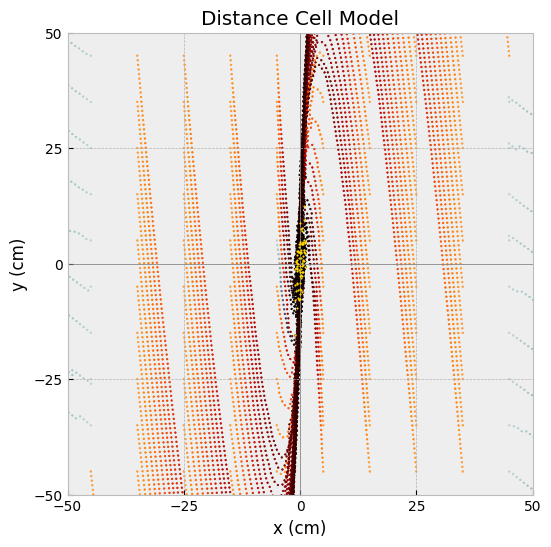

Successful trials: 81/100 (81.0%)
{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=22500 (DCM)
	xdc_positions=[[-450.   -449.96 -449.92],...,[449.88 449.92 449.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [02:44<00:00,  1.64s/it]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-22500_Nfvc-None.pkl



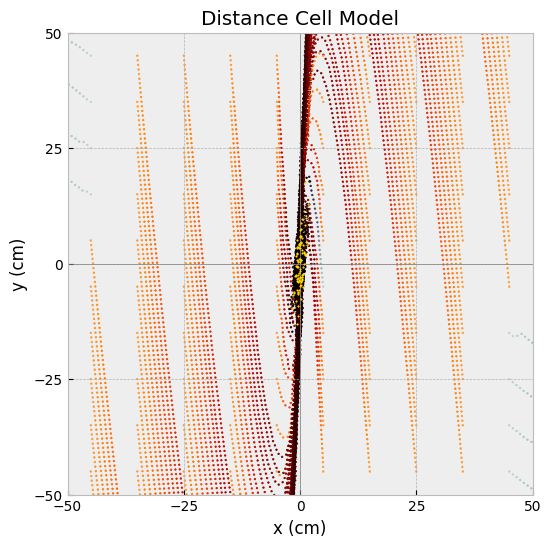

Successful trials: 91/100 (91.0%)
{'shear-global-1': {'distortion': 'shear-global', 'a': 0, 'b': 10, 'b_drift': None}}

 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+ RUNNING SIMULATIONS FOR DISTORTION=shear-global-1 -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
Running new simulation for ***Distance Cell Model*** with distortion=shear-global (a=0, b=10)...
PARAMETERS:
	M=10, min_scale=25, scale_ratio=1.5, m=20, r_max=30, poiss_time_w=0.1
	N_dc=25000 (DCM)
	xdc_positions=[[-500.   -499.96 -499.92],...,[499.88 499.92 499.96]] (DCM)
	Scales=[25.0, 37.5, 56.25, 84.38, 126.56, 189.84, 284.77, 427.15, 640.72, 961.08]
OPEN FIELD: True


Simulating trials: 100%|██████████| 100/100 [03:11<00:00,  1.92s/it]


Saved simulation data to simulation_outputs/round-11/global/dcm_trials-100_shear-global_a-0_b-10_Ndc-25000_Nfvc-None.pkl



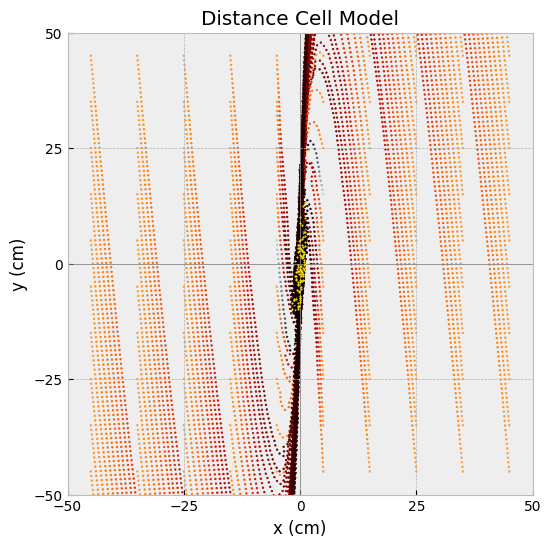

Successful trials: 98/100 (98.0%)


In [2]:
########################### EXTRA ANALYSIS ####################################
N_SIM_ROUND = 11
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
HEX_PROJ=True

model_names = ['dcm']
N_dcs = [12500, 15000, 17500, 20000, 22500, 25000]
###############################################################################

strongest_shear_global_params = get_param_dict({'a': [0], 'b': [10]}, 
                                     'shear-global', incl_undistorted=False)

for curr_distortion_params in [shear_global_params]: #stretch_simulations + shear_simulations:
    for curr_N_dc in N_dcs:
        print(curr_distortion_params)
        for distortion_name in curr_distortion_params.keys():
            print(F'\n {"-+" * 30} RUNNING SIMULATIONS FOR DISTORTION={distortion_name} {"-+" * 30}')
            for model_name in model_names:
                x_histories, y_histories = run_load_simulation(model_name, 
                                                            arena_width=ARENA_WIDTH, 
                                                            step_size=STEP_SIZE,
                                                            convergence_threshold=CONV_THRESH,
                                                            n_trials=N_TRIALS, 
                                                            distortion_params=curr_distortion_params[distortion_name],
                                                            n_sim_round=N_SIM_ROUND,
                                                            N_dc=curr_N_dc,
                                                            save_data=True)
                plot_trajectories(model_name, x_histories, y_histories, arena_width=ARENA_WIDTH)

{'shear-modular-1': {'distortion': 'shear-modular', 'a': 0, 'b': 0, 'b_drift': None}, 'shear-modular-2': {'distortion': 'shear-modular', 'a': 0, 'b': 1, 'b_drift': None}, 'shear-modular-3': {'distortion': 'shear-modular', 'a': 0, 'b': 2, 'b_drift': None}, 'shear-modular-4': {'distortion': 'shear-modular', 'a': 0, 'b': 5, 'b_drift': None}, 'shear-modular-5': {'distortion': 'shear-modular', 'a': 0, 'b': 10, 'b_drift': None}}


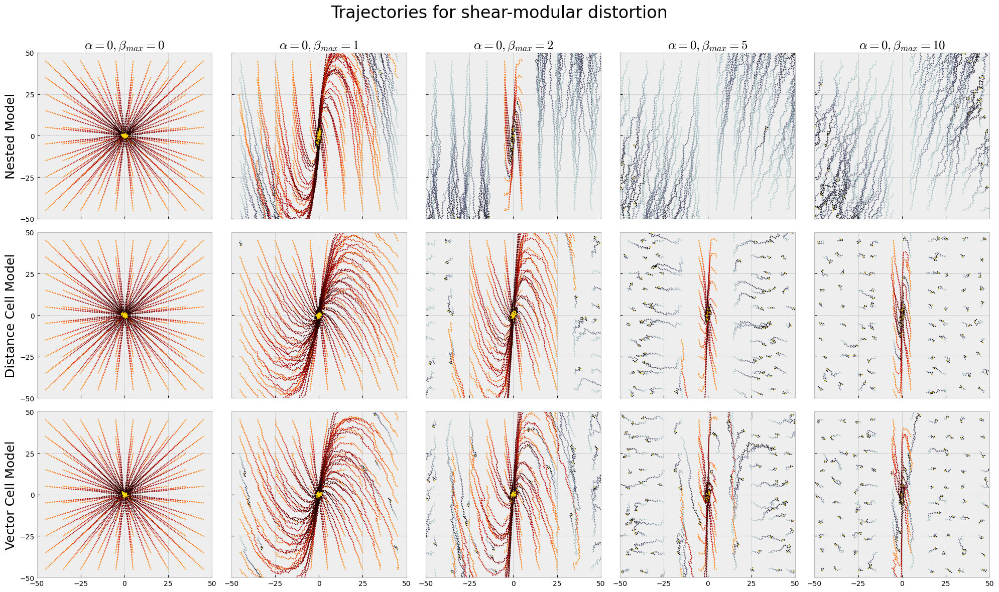

conditions before ['b-0', 'b-1', 'b-2', 'b-5', 'b-10']
conditions after ['\\beta_{max}=0', '\\beta_{max}=1', '\\beta_{max}=2', '\\beta_{max}=5', '\\beta_{max}=10']


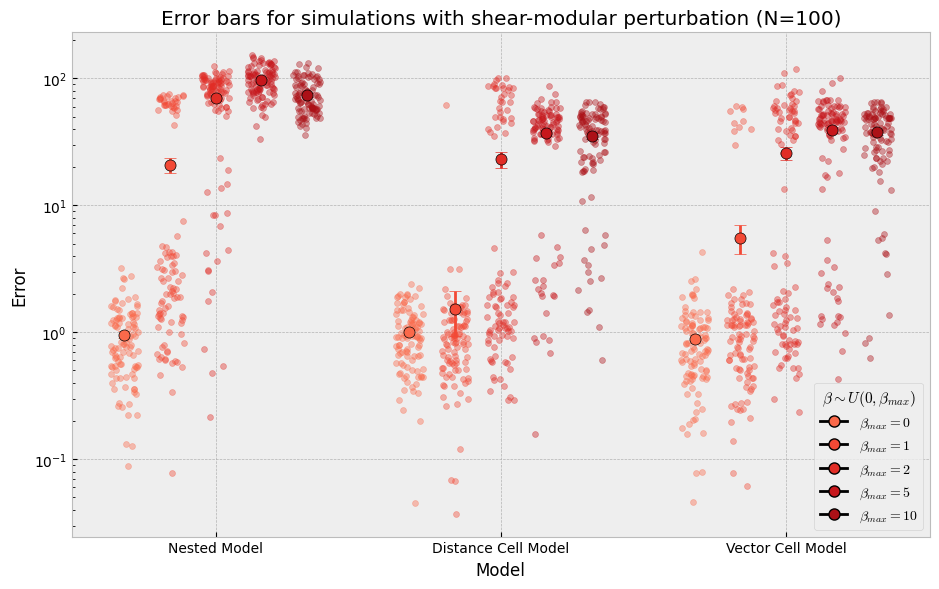

{'stretch-modular-1': {'distortion': 'stretch-modular', 'a': 1, 'b': 1, 'b_drift': None}, 'stretch-modular-2': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.7, 'b_drift': None}, 'stretch-modular-3': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.5, 'b_drift': None}, 'stretch-modular-4': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.3, 'b_drift': None}, 'stretch-modular-5': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.1, 'b_drift': None}}


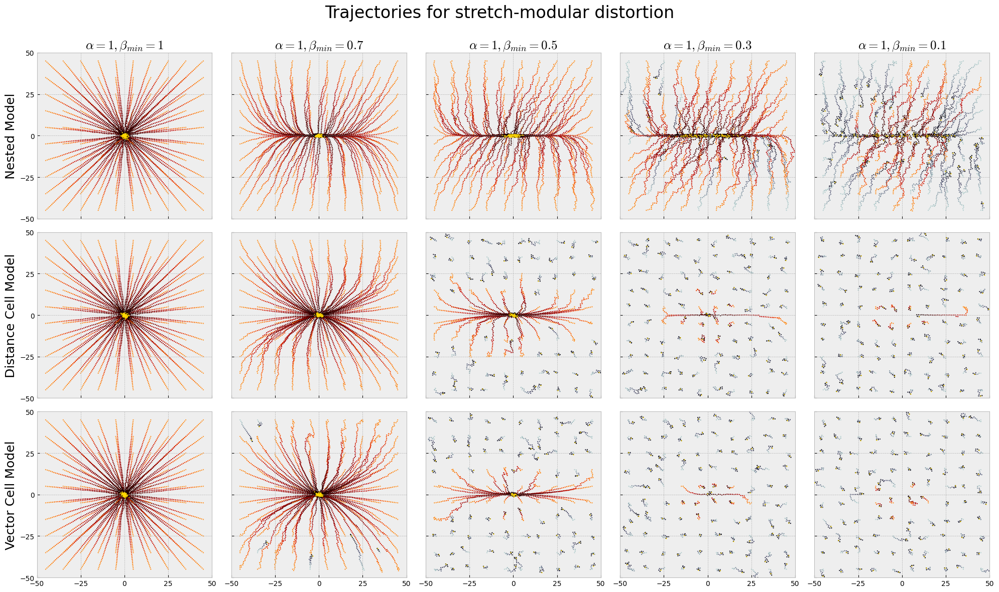

conditions before ['b-1', 'b-0.7', 'b-0.5', 'b-0.3', 'b-0.1']
conditions after ['\\beta_{min}=1', '\\beta_{min}=0.7', '\\beta_{min}=0.5', '\\beta_{min}=0.3', '\\beta_{min}=0.1']


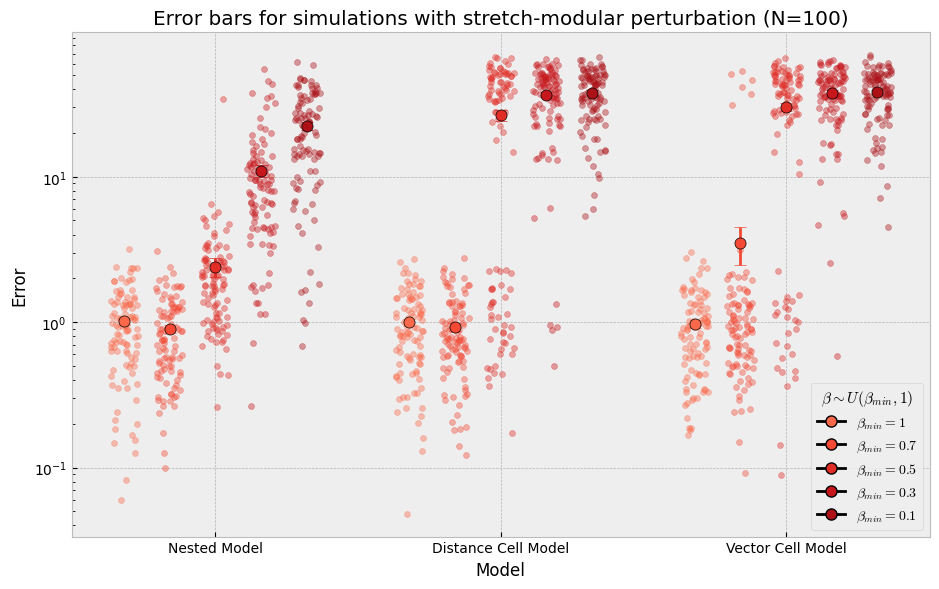

In [8]:
N_SIM_ROUND = 12
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
model_names = ['nm', 'dcm', 'vcm']

for curr_distortion_params in [shear_modular_params, stretch_modular_params]: #stretch_simulations + shear_simulations:
    print(curr_distortion_params)
    run_sim = False
    if run_sim: 
        for distortion_name in curr_distortion_params.keys():
            print(F'\n {"-+" * 30} RUNNING SIMULATIONS FOR DISTORTION={distortion_name} {"-+" * 30}')
            for model_name in model_names:
                x_histories, y_histories = run_load_simulation(model_name, 
                                                            arena_width=ARENA_WIDTH, 
                                                            step_size=STEP_SIZE,
                                                            convergence_threshold=CONV_THRESH,
                                                            n_trials=N_TRIALS, 
                                                            distortion_params=curr_distortion_params[distortion_name],
                                                            n_sim_round=N_SIM_ROUND,
                                                            save_data=False)
                plot_trajectories(model_name, x_histories, y_histories, arena_width=ARENA_WIDTH)
    if not run_sim:
        plot_trajectories_all_models(curr_distortion_params, 
                                model_names, 
                                arena_width=ARENA_WIDTH, 
                                step_size=STEP_SIZE, 
                                convergence_threshold=CONV_THRESH, 
                                n_trials=N_TRIALS, 
                                n_sim_round= N_SIM_ROUND,
                                save_fig=False)

        plot_error_bars(curr_distortion_params,
                        model_names,
                        n_trials=N_TRIALS, 
                        n_sim_round=N_SIM_ROUND)

In [2]:
N_SIM_ROUND = 12
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
HEX_PROJ=True
model_names = ['nm', 'dcm', 'vcm']

no_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None}}
example_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None},
                     'shear1': {'distortion': 'shear', 'a': 0, 'b': 0.3},
                     'stretch1': {'distortion': 'stretch', 'a': 1, 'b': 0.67}}

# Global distortion parameters
shear_drift_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 3, 5], 'b_drift': [0.1]}, 
                                     'shear+drift-global', incl_undistorted=False)

shear_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                     'shear-global', incl_undistorted=False)
stretch_global_params = get_param_dict({'a': [1], 'b': [1, 0.7, 0.5, 0.3, 0.1]}, 
                                       'stretch-global', incl_undistorted=False)

# Local distortion parameters
shear_local_params = get_param_dict({'a': [0], 'b': [0, 0.05, 0.1, 0.3, 0.5]}, 
                                     'shear-local', incl_undistorted=False)
stretch_local_params = get_param_dict({'a': [1], 'b': [1, 0.99, 0.95, 0.9, 0.7]}, 
                                       'stretch-local', incl_undistorted=False)

# Modular distortion parameters
shear_modular_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                'shear-modular', incl_undistorted=False)
stretch_modular_params = get_param_dict({'a': [1], 'b': [0, 0.3, 0.5, 0.7, 0.9]},  # WARNING: Here b_final is 1 - b, so at b=0.5 we'd have b_M's = [0.99, 0.98, 0.97, 0.96, 0.93, 0.9 , 0.85, 0.78, 0.67, 0.5 ]
                                'stretch-modular', incl_undistorted=False)


KeyError: -1

{'shear-modular-1': {'distortion': 'shear-modular', 'a': 0, 'b': 0, 'b_drift': None}, 'shear-modular-2': {'distortion': 'shear-modular', 'a': 0, 'b': 1, 'b_drift': None}, 'shear-modular-3': {'distortion': 'shear-modular', 'a': 0, 'b': 2, 'b_drift': None}, 'shear-modular-4': {'distortion': 'shear-modular', 'a': 0, 'b': 5, 'b_drift': None}, 'shear-modular-5': {'distortion': 'shear-modular', 'a': 0, 'b': 10, 'b_drift': None}}


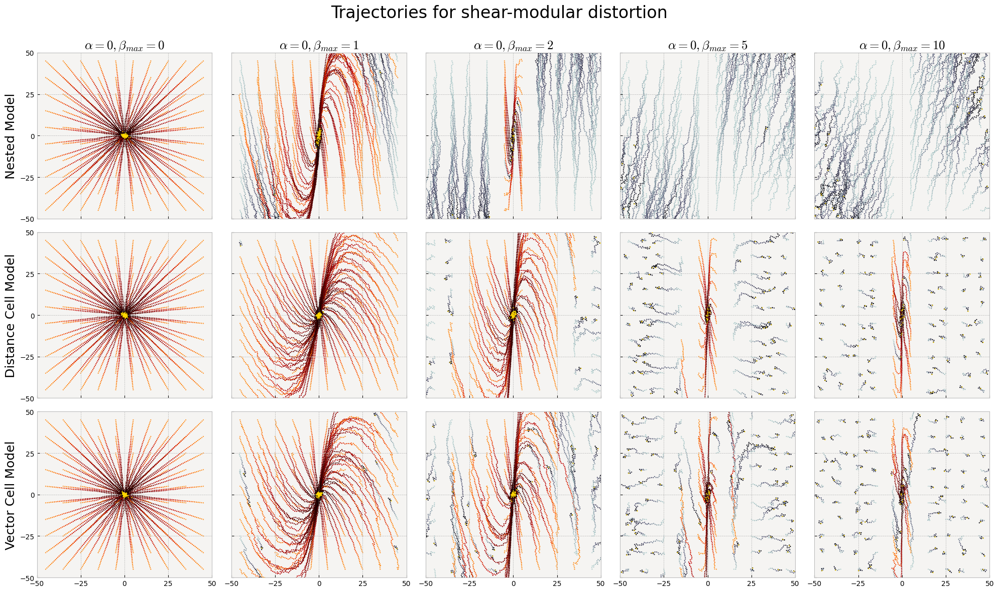

conditions before ['b-0', 'b-1', 'b-2', 'b-5', 'b-10']
conditions after ['\\beta_{max}=0', '\\beta_{max}=1', '\\beta_{max}=2', '\\beta_{max}=5', '\\beta_{max}=10']


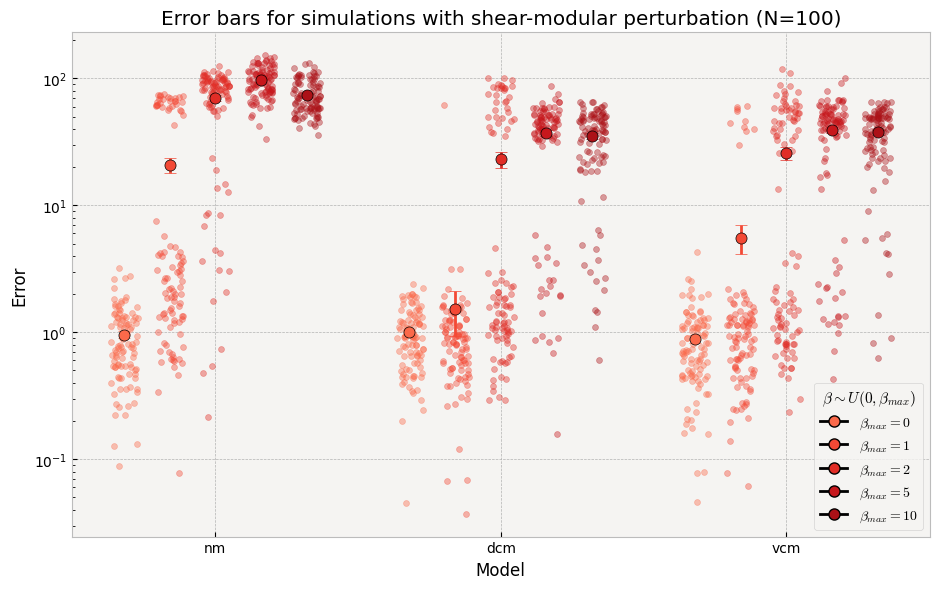

{'stretch-modular-1': {'distortion': 'stretch-modular', 'a': 1, 'b': 1, 'b_drift': None}, 'stretch-modular-2': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.7, 'b_drift': None}, 'stretch-modular-3': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.5, 'b_drift': None}, 'stretch-modular-4': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.3, 'b_drift': None}, 'stretch-modular-5': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.1, 'b_drift': None}}


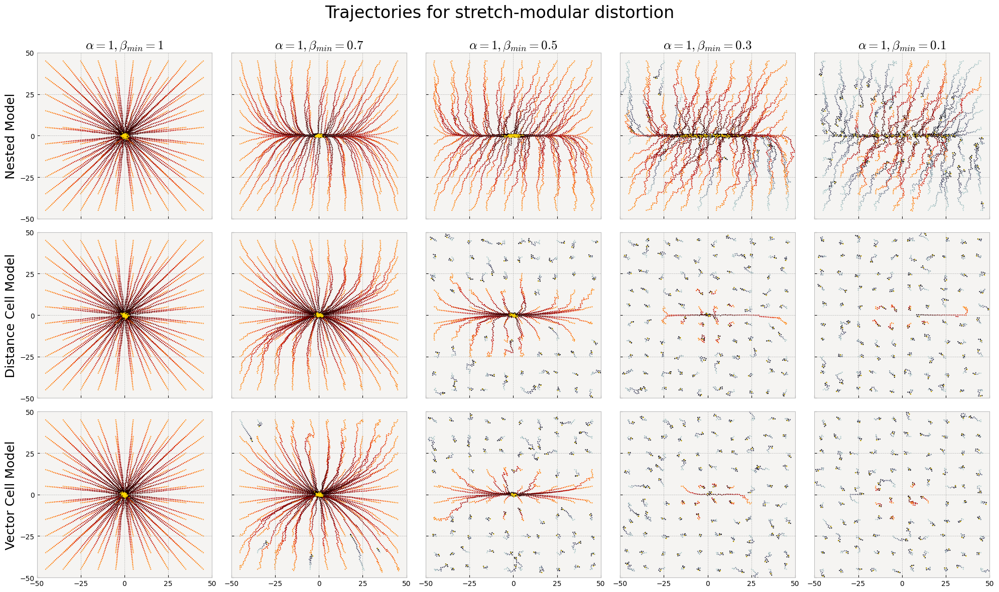

conditions before ['b-1', 'b-0.7', 'b-0.5', 'b-0.3', 'b-0.1']
conditions after ['\\beta_{min}=1', '\\beta_{min}=0.7', '\\beta_{min}=0.5', '\\beta_{min}=0.3', '\\beta_{min}=0.1']


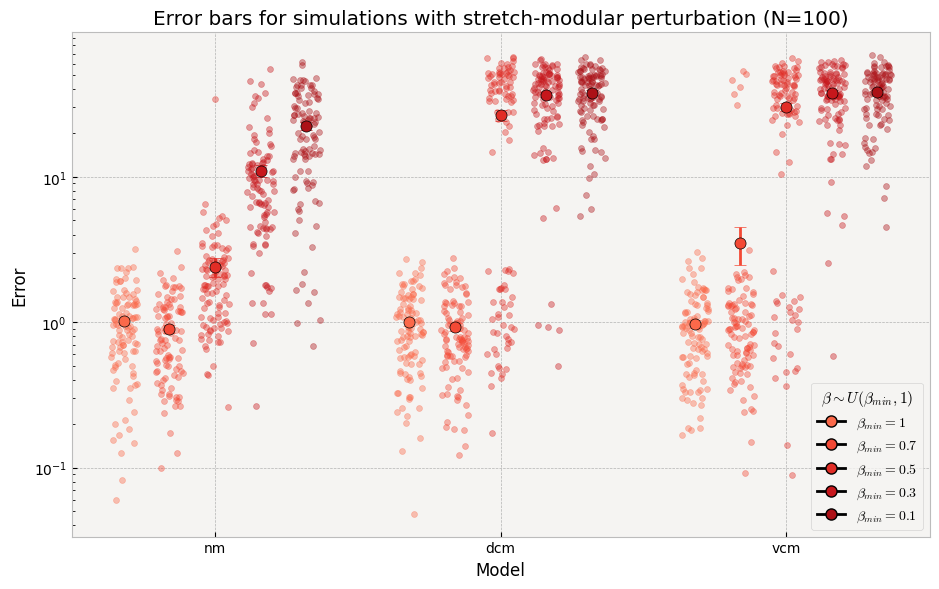

NameError: name 'aksdnjfksadjnf' is not defined

In [ ]:
# ================= MODEL & SIMULATION PARAMETERS =================
N_SIM_ROUND = 12
N_TRIALS = 100
ARENA_WIDTH = 100
STEP_SIZE = 1
CONV_THRESH = STEP_SIZE * 1.5
HEX_PROJ=True
model_names = ['nm', 'dcm', 'vcm']

no_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None}}
example_distortion_params = {'undistorted-0': {'distortion': 'none-global', 'a': None, 'b':None},
                     'shear1': {'distortion': 'shear', 'a': 0, 'b': 0.3},
                     'stretch1': {'distortion': 'stretch', 'a': 1, 'b': 0.67}}

# Global distortion parameters
shear_drift_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 3, 5], 'b_drift': [0.1]}, 
                                     'shear+drift-global', incl_undistorted=False)

shear_global_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                     'shear-global', incl_undistorted=False)
stretch_global_params = get_param_dict({'a': [1], 'b': [1, 0.7, 0.5, 0.3, 0.1]}, 
                                       'stretch-global', incl_undistorted=False)

# Local distortion parameters
shear_local_params = get_param_dict({'a': [0], 'b': [0, 0.05, 0.1, 0.3, 0.5]}, 
                                     'shear-local', incl_undistorted=False)
stretch_local_params = get_param_dict({'a': [1], 'b': [1, 0.99, 0.95, 0.9, 0.7]}, 
                                       'stretch-local', incl_undistorted=False)

# Modular distortion parameters
shear_modular_params = get_param_dict({'a': [0], 'b': [0, 1, 2, 5, 10]}, 
                                'shear-modular', incl_undistorted=False)
stretch_modular_params = get_param_dict({'a': [1], 'b': [1, 0.7, 0.5, 0.3, 0.1]},  # WARNING: Here b_final is 1 - b, so at b=0.5 we'd have b_M's = [0.99, 0.98, 0.97, 0.96, 0.93, 0.9 , 0.85, 0.78, 0.67, 0.5 ]
                                'stretch-modular', incl_undistorted=False)

stretch_simulations = [stretch_global_params, stretch_modular_params, stretch_local_params]
shear_simulations = [shear_global_params, shear_modular_params, shear_local_params, shear_drift_global_params]

for curr_distortion_params in [shear_modular_params, stretch_modular_params]: #stretch_simulations + shear_simulations:
    print(curr_distortion_params)
    run_sim = False
    if run_sim: 
        for distortion_name in curr_distortion_params.keys():
            print(F'\n {"-+" * 30} RUNNING SIMULATIONS FOR DISTORTION={distortion_name} {"-+" * 30}')
            for model_name in model_names:
                x_histories, y_histories = run_load_simulation(model_name, 
                                                            arena_width=ARENA_WIDTH, 
                                                            step_size=STEP_SIZE,
                                                            convergence_threshold=CONV_THRESH,
                                                            n_trials=N_TRIALS, 
                                                            distortion_params=curr_distortion_params[distortion_name],
                                                            n_sim_round=N_SIM_ROUND,
                                                            save_data=False)
                plot_trajectories(model_name, x_histories, y_histories, arena_width=ARENA_WIDTH)
    if not run_sim:

        plot_trajectories_all_models(curr_distortion_params, 
                                model_names, 
                                arena_width=ARENA_WIDTH, 
                                step_size=STEP_SIZE, 
                                convergence_threshold=CONV_THRESH, 
                                n_trials=N_TRIALS, 
                                n_sim_round= N_SIM_ROUND,
                                save_fig=False)

        plot_error_bars(curr_distortion_params,
                        model_names,
                        n_trials=N_TRIALS, 
                        n_sim_round=N_SIM_ROUND)
aksdnjfksadjnf

{'shear-modular-1': {'distortion': 'shear-modular', 'a': 0, 'b': 0, 'b_drift': None}, 'shear-modular-2': {'distortion': 'shear-modular', 'a': 0, 'b': 1, 'b_drift': None}, 'shear-modular-3': {'distortion': 'shear-modular', 'a': 0, 'b': 2, 'b_drift': None}, 'shear-modular-4': {'distortion': 'shear-modular', 'a': 0, 'b': 5, 'b_drift': None}, 'shear-modular-5': {'distortion': 'shear-modular', 'a': 0, 'b': 10, 'b_drift': None}}
conditions before ['b-0', 'b-1', 'b-2', 'b-5', 'b-10']
conditions after ['\\beta_{max}=0', '\\beta_{max}=1', '\\beta_{max}=2', '\\beta_{max}=5', '\\beta_{max}=10']


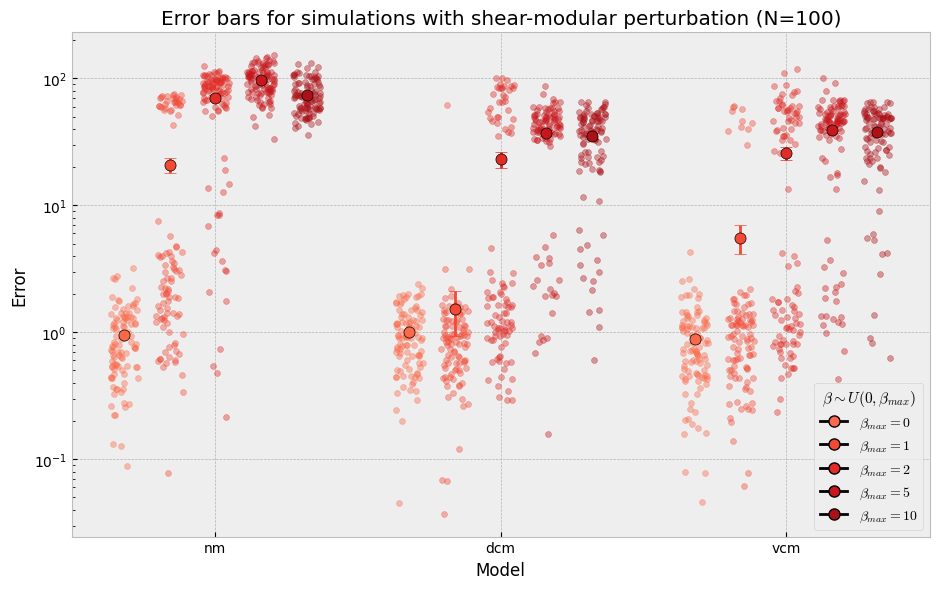

{'stretch-modular-1': {'distortion': 'stretch-modular', 'a': 1, 'b': 0, 'b_drift': None}, 'stretch-modular-2': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.3, 'b_drift': None}, 'stretch-modular-3': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.5, 'b_drift': None}, 'stretch-modular-4': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.7, 'b_drift': None}, 'stretch-modular-5': {'distortion': 'stretch-modular', 'a': 1, 'b': 0.9, 'b_drift': None}}
conditions before ['b-0', 'b-0.3', 'b-0.5', 'b-0.7', 'b-0.9']
conditions after ['\\beta_{min}=0', '\\beta_{min}=0.3', '\\beta_{min}=0.5', '\\beta_{min}=0.7', '\\beta_{min}=0.9']


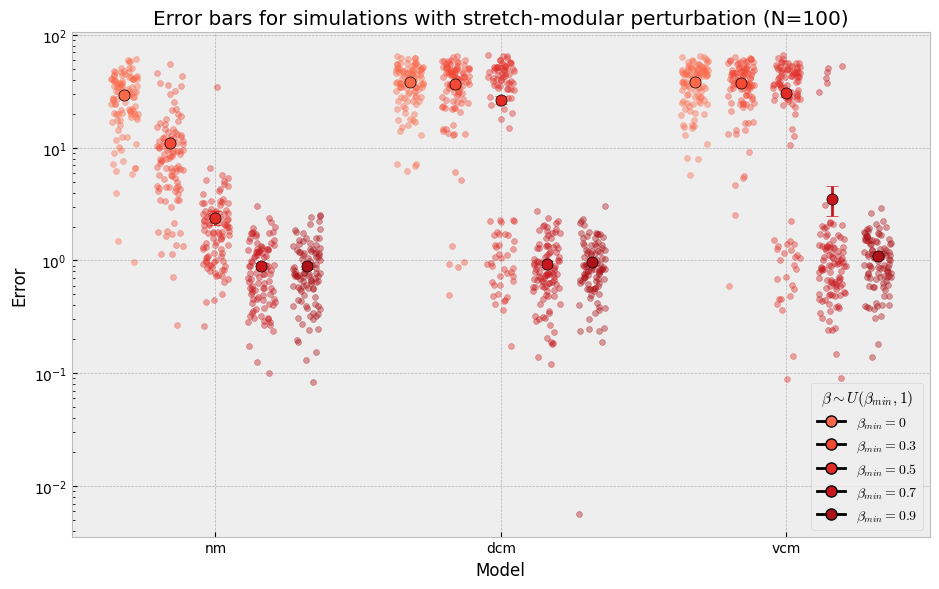

NameError: name 'aksdnjfksadjnf' is not defined

In [7]:

# =================================================================

for curr_distortion_params in [shear_modular_params, stretch_modular_params]: #stretch_simulations + shear_simulations:
    print(curr_distortion_params)
    run_sim = False
    if run_sim: 
        for distortion_name in curr_distortion_params.keys():
            print(F'\n {"-+" * 30} RUNNING SIMULATIONS FOR DISTORTION={distortion_name} {"-+" * 30}')
            for model_name in model_names:
                x_histories, y_histories = run_load_simulation(model_name, 
                                                            arena_width=ARENA_WIDTH, 
                                                            step_size=STEP_SIZE,
                                                            convergence_threshold=CONV_THRESH,
                                                            n_trials=N_TRIALS, 
                                                            distortion_params=curr_distortion_params[distortion_name],
                                                            n_sim_round=N_SIM_ROUND,
                                                            save_data=True)

    if not run_sim:
        if False:
            plot_trajectories_all_models(curr_distortion_params, 
                                    model_names, 
                                    arena_width=ARENA_WIDTH, 
                                    step_size=STEP_SIZE, 
                                    convergence_threshold=CONV_THRESH, 
                                    n_trials=N_TRIALS, 
                                    n_sim_round= N_SIM_ROUND,
                                    save_fig=True)
        plot_error_bars(curr_distortion_params,
                        model_names,
                        n_trials=N_TRIALS, 
                        n_sim_round=N_SIM_ROUND)
aksdnjfksadjnf

In [ ]:
# ----------------------------------------------------------------#
N_SIM_ROUND = 8
N_TRIALS = 100
stretch_global_params = get_param_dict({'a': [1], 'b': [1]}, 
                                       'stretch-global', incl_undistorted=False)
selected_distortion_params = stretch_global_params
for distortion_name in selected_distortion_params.keys():
    print(F'\n {"-+" * 30} RUNNING SIMULATIONS FOR DISTORTION={distortion_name} {"-+" * 30}')
    for model_name in ['vcm']:
        x_histories, y_histories = run_load_simulation(model_name, 
                                                    arena_width=ARENA_WIDTH, 
                                                    step_size=STEP_SIZE,
                                                    convergence_threshold=CONV_THRESH,
                                                    n_trials=N_TRIALS, 
                                                    distortion_params=selected_distortion_params[distortion_name],
                                                    hexagonal_projection=HEX_PROJ,
                                                    n_sim_round= N_SIM_ROUND,
                                                    save_data=False)
        plot_trajectories(model_name, x_histories, y_histories, arena_width=ARENA_WIDTH)

In [ ]:
plot_error_bars(distortion='shear-global', distortion_params=shear_global_params, n_trials=N_TRIALS, model_names=model_names)
plot_error_bars(distortion='shear-modular', distortion_params=shear_modular_params, n_trials=N_TRIALS, model_names=model_names)
plot_error_bars(distortion='shear-local', distortion_params=shear_local_params, n_trials=N_TRIALS, model_names=model_names)

In [ ]:
arena_width = 100
n_trials = 100
border_offset = 0.05 * arena_width
square_half_width = (arena_width / 2)
offset_square_half_width = square_half_width - border_offset

XS = np.linspace(-offset_square_half_width, offset_square_half_width, int(np.sqrt(n_trials)))
YS = np.linspace(-offset_square_half_width, offset_square_half_width, int(np.sqrt(n_trials)))
start_locs = np.array(np.meshgrid(XS, YS)).T.reshape(-1, 2)
print('start_locs:', start_locs.shape)

print('Projecting evenly spaced start locations onto hexagonal grid axes...')
PX, PY = np.meshgrid(XS, YS)
original_grid = np.array([PX.ravel(), PY.ravel()])  # (2, N) — evenly spaced in axis space
start_locs = project_onto_axis_back(original_grid, l1=1, l2=2)  # (2, N) — parallelogram in real space
start_locs = start_locs.T  # (N, 2)
print('start_locs:', start_locs.shape)


start_locs: (100, 2)
Projecting evenly spaced start locations onto hexagonal grid axes...
start_locs: (100, 2)
